In [1]:
import scanpy as sc
import os
import numpy as np
import seaborn
import matplotlib
import pandas as pd
import sys
import scipy
import tqdm

sys.path.append('/home/matthew.schmitz/utils/mts-utils/')
from genomics import sc_analysis
import antipode


/home/matthew.schmitz/Matthew/utils/miniforge3/envs/antipode/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# DEV to ABC

In [2]:
adata=sc.read_h5ad('/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matthew/data/mouse_wb/AIT21.all.freeze.230815_humanorthos.h5ad',backed='r')

In [21]:
subclass_outputs=antipode.plotting.group_aggr_anndata(adata,'subclass_label')
subclass_meangenes=pd.DataFrame(subclass_outputs[0],index=subclass_outputs[1]['subclass_label'],columns=adata.var.index)
subclass_meangenes.to_csv('/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matthew/data/mouse_wb/AIT21.all.freeze.230815_subclassmeans.csv')

In [2]:
subclass_meangenes=pd.read_csv('/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matthew/data/mouse_wb/AIT21.all.freeze.230815_subclassmeans.csv',index_col=0)

In [3]:
import json

# Path to your JSON file
file_path = '/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matthew/data/mouse_wb/AIT21.all.freeze.230815_humanorthos_ABC_MAPPING/hann_results.json'

# Open the file and load its content
with open(file_path, 'r') as file:
    data = json.load(file)

rows = []
for item in data['results']:
    row = {
        'cell_id': item['cell_id'],
        'level_1': item['level_1']['assignment'],
        'level_2': item['level_2']['assignment'],
    }
    rows.append(row)

# Create a DataFrame
df = pd.DataFrame(rows)
df.index=df['cell_id']
adata.obs.loc[df['cell_id'],["level_1", "level_2"]]=df.loc[:,["level_1", "level_2"]]


In [6]:
adata.obs.loc[:,["level_2",'class_label','subclass_label','supertype_label']]

,level_2,class_label,subclass_label,supertype_label
AACGTTGAGGCTAGCA-L8TX_181031_01_E08-1178471673,69,11 CNU-HYa GABA,078 SI-MA-ACB Ebf1 Bnc2 Gaba,0366 SI-MA-ACB Ebf1 Bnc2 Gaba_3
CAGGTGCAGGCTAGCA-L8TX_180815_01_E08-1178465136,69,11 CNU-HYa GABA,078 SI-MA-ACB Ebf1 Bnc2 Gaba,0366 SI-MA-ACB Ebf1 Bnc2 Gaba_3
TGATTCTGTTCTCAGA-L8TX_190531_01_G01-1178165016,189,11 CNU-HYa GABA,078 SI-MA-ACB Ebf1 Bnc2 Gaba,0366 SI-MA-ACB Ebf1 Bnc2 Gaba_3
ATGAGGGAGAGTCCGA-L8TX_200827_01_C10-1177902769,110,11 CNU-HYa GABA,078 SI-MA-ACB Ebf1 Bnc2 Gaba,0366 SI-MA-ACB Ebf1 Bnc2 Gaba_3
CGAGTGCTCTGCATAG-L8TX_190531_01_C02-1178164958,77,11 CNU-HYa GABA,078 SI-MA-ACB Ebf1 Bnc2 Gaba,0366 SI-MA-ACB Ebf1 Bnc2 Gaba_3
...,...,...,...,...
TTTGTTGTCTCACTCG-L8TX_201112_01_A06-1177903822,85,34 Immune,334 Microglia NN,1194 Microglia NN_1
TTTGTTGTCTCCATAT-L8TX_201016_01_C04-1177903195,85,34 Immune,334 Microglia NN,1194 Microglia NN_1
TTTGTTGTCTCTCGCA-L8TX_201106_01_B03-1177903709,85,34 Immune,334 Microglia NN,1194 Microglia NN_1
TTTGTTGTCTTACGGA-L8TX_200827_01_B09-1178467933,190,33 Vascular,332 SMC NN,1192 SMC NN_1


/scratch/fast/16816803/ipykernel_11130/2859652318.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  seaborn.clustermap(np.log(adata.obs.loc[adata.obs['class_label']!='05 OB-IMN GABA',:].groupby('class_label')['level_2'].value_counts().unstack()+1))


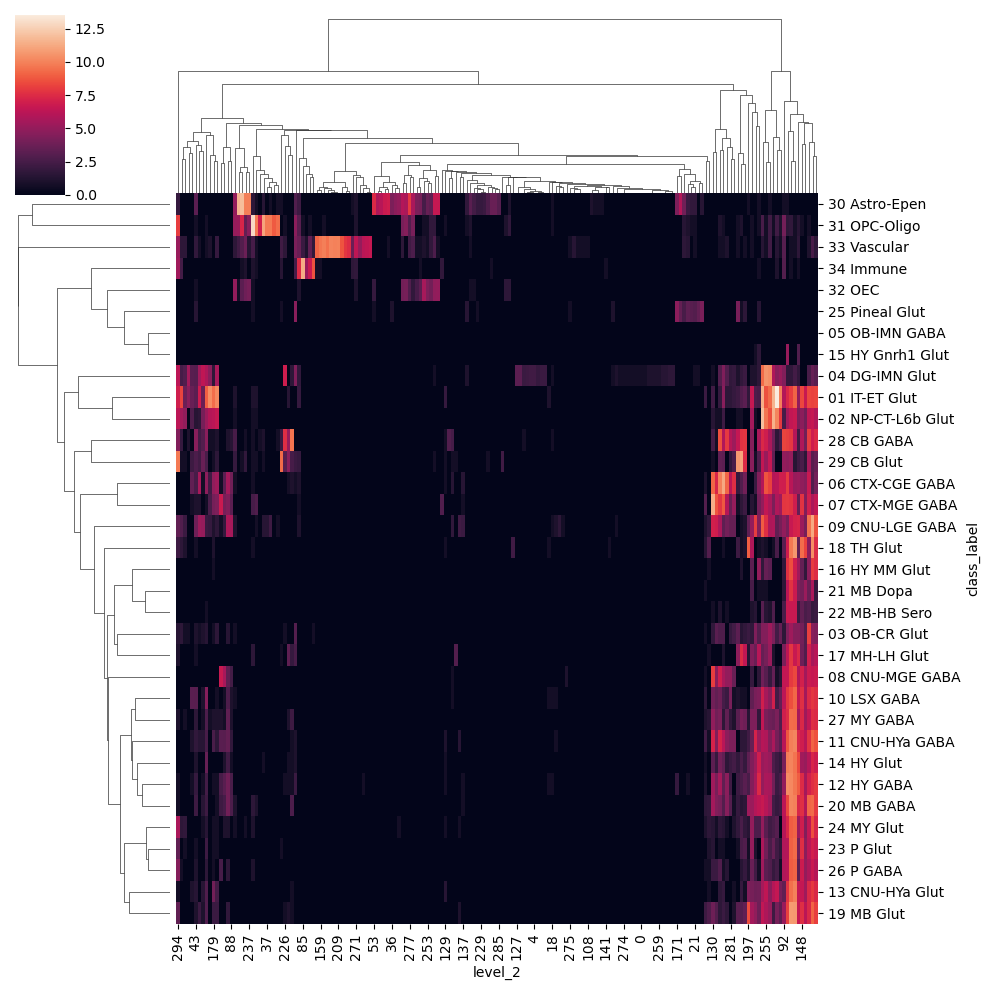

In [8]:
seaborn.clustermap(np.log(adata.obs.loc[adata.obs['class_label']!='05 OB-IMN GABA',:].groupby('class_label')['level_2'].value_counts().unstack()+1))

# ABC to DEV

In [36]:
adata=sc.read_h5ad('/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matthew/models/1.9.1.8.3_Dev/p4_adata.h5ad',backed='r')

In [37]:
MDE_KEY='X_antipode_MDE'

In [38]:
import json

# Path to your JSON file
file_path = '/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matthew/data/taxtest/HvQvM/HvQvMall_cere_clean_nodoublets_ABC_MAPPING/hann_results.json'

# Open the file and load its content
with open(file_path, 'r') as file:
    data = json.load(file)

rows = []
for item in data['results']:
    row = {
        'cell_id': item['cell_id'],
        'class_label': item['class_label']['assignment'],
        'supertype_label': item['supertype_label']['assignment'],
        'subclass_label': item['subclass_label']['assignment'],
        'class_label2': item['class_label']['runner_up_assignment'],
        'supertype_label2': item['supertype_label']['runner_up_assignment'],
        'subclass_label2': item['subclass_label']['runner_up_assignment']
    }
    rows.append(row)

# Create a DataFrame
df = pd.DataFrame(rows)
df.index=df['cell_id']
df=df.loc[df['cell_id'].isin(adata.obs.index),:]
adata.obs.loc[df['cell_id'],["class_label", "supertype_label", "subclass_label","class_label2", "supertype_label2", "subclass_label2"]]='nan'
adata.obs.loc[df['cell_id'],["class_label", "supertype_label", "subclass_label","class_label2", "supertype_label2", "subclass_label2"]]=df.loc[:,["class_label", "supertype_label", "subclass_label","class_label2", "supertype_label2", "subclass_label2"]]


In [56]:
import json

# Path to your JSON file
file_path = '/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matthew/data/taxtest/HvQvM/HvQvMall_cere_clean_nodoublets_juvenile_MAPPING//hann_results.json'

# Open the file and load its content
with open(file_path, 'r') as file:
    data = json.load(file)

rows = []
for item in data['results']:
    row = {
        'cell_id': item['cell_id'],
        'class_label': item['class_label']['assignment'],
        'supertype_label': item['supertype_label']['assignment'],
        'subclass_label': item['subclass_label']['assignment']
    }
    rows.append(row)

# Create a DataFrame
df = pd.DataFrame(rows)
df.index=list(df['cell_id'])
df=df.loc[df['cell_id'].isin(adata.obs.index),:]
df=df.loc[~df.index.duplicated(),:]
df.columns=['juvenile_'+x for x in df.columns]
adata.obs.loc[df.index,["juvenile_class_label", "juvenile_supertype_label", "juvenile_subclass_label"]]=df.loc[:,["juvenile_class_label", "juvenile_supertype_label", "juvenile_subclass_label"]]

/scratch/fast/16801818/ipykernel_21975/1225129148.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  seaborn.clustermap(np.log(adata.obs.groupby('general_region')['supertype_label'].value_counts().unstack()+1))


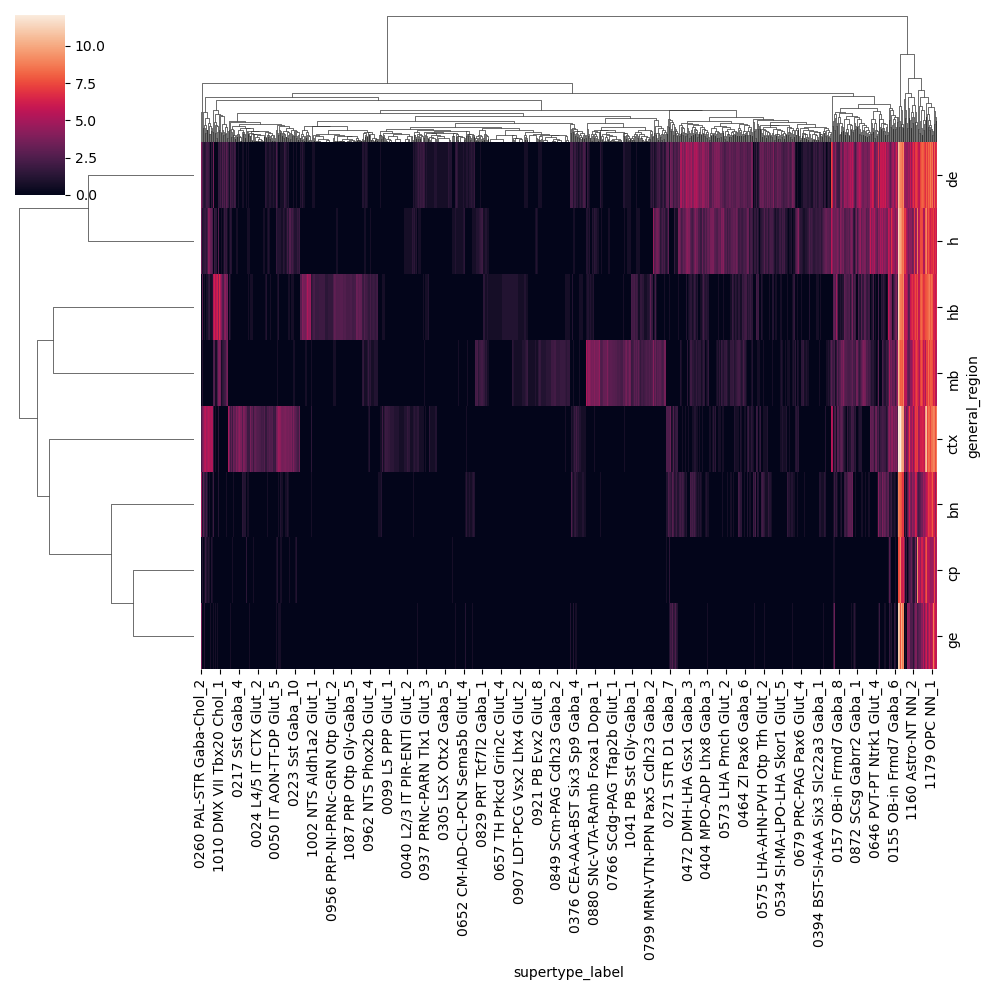

In [39]:
seaborn.clustermap(np.log(adata.obs.groupby('general_region')['supertype_label'].value_counts().unstack()+1))

/scratch/fast/16801818/ipykernel_21975/253314669.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  seaborn.clustermap(np.log(adata.obs.groupby('general_region')['juvenile_subclass_label'].value_counts().unstack()+1))


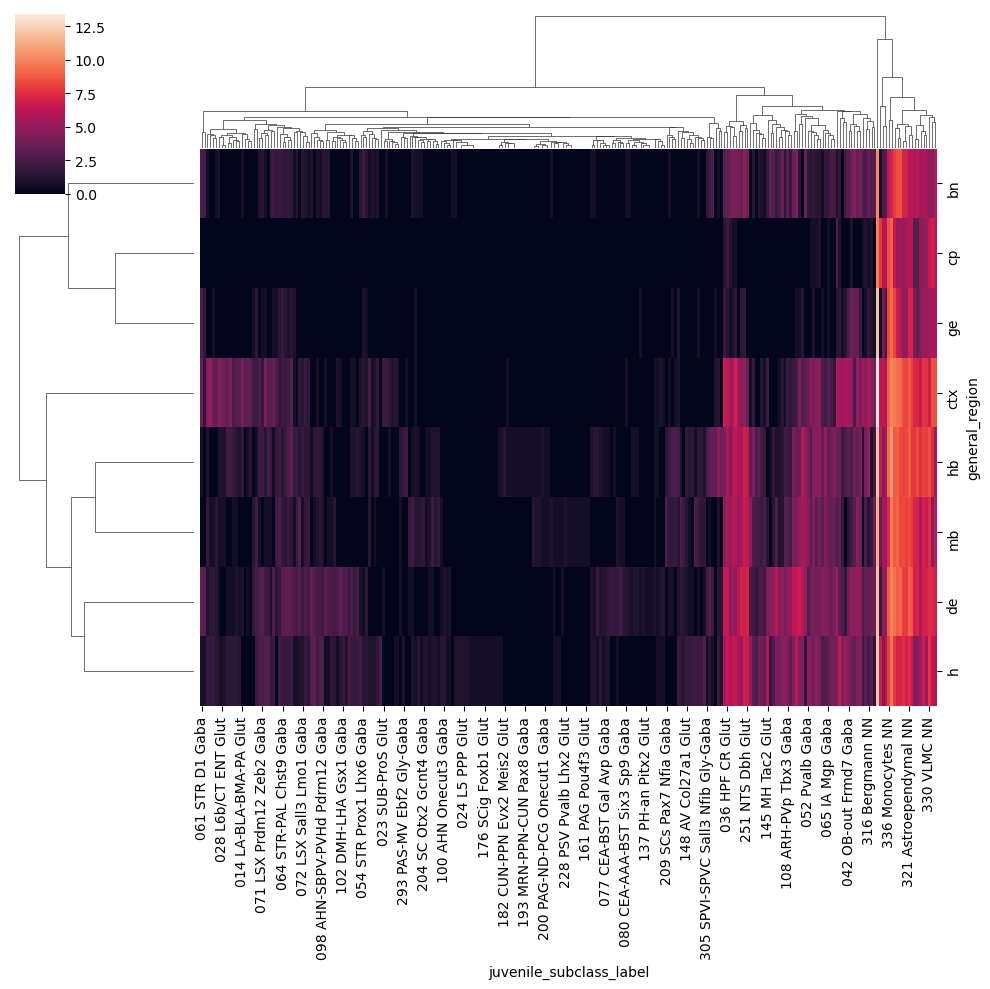

In [104]:
seaborn.clustermap(np.log(adata.obs.groupby('general_region')['juvenile_subclass_label'].value_counts().unstack()+1))

In [7]:
adata.obs.loc[:,['class_label','supertype_label','subclass_label']].to_csv('/home/matthew.schmitz/Matthew/data/taxtest/HvQvM/ABC_mappings.txt')

In [8]:
# adata=sc.read_h5ad('/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matthew/models/1.9.1.8.3_Dev/p4_adata.h5ad',backed='r')
# adata.obs.loc[:,['class_label','supertype_label','subclass_label']]=pd.read_csv('/home/matthew.schmitz/Matthew/data/taxtest/HvQvM/ABC_mappings.txt',index_col=0)
# adata.obs.loc[:,['class_label','supertype_label','subclass_label']]=adata.obs.loc[:,['class_label','supertype_label','subclass_label']].astype(str)

In [9]:
adata.uns['species_colors']=adata.uns['species_color_dict'].values()
adata.uns['region_colors']=adata.uns['region_colors_dict'].values()
adata.uns['general_region_colors']=adata.uns['general_region_color_dict'].values()

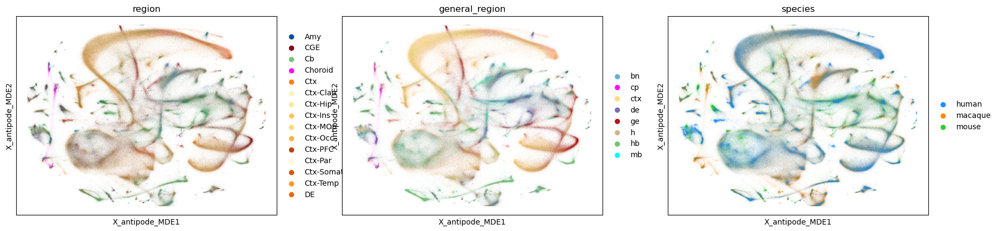

In [11]:
sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=["region",'general_region','species']
)


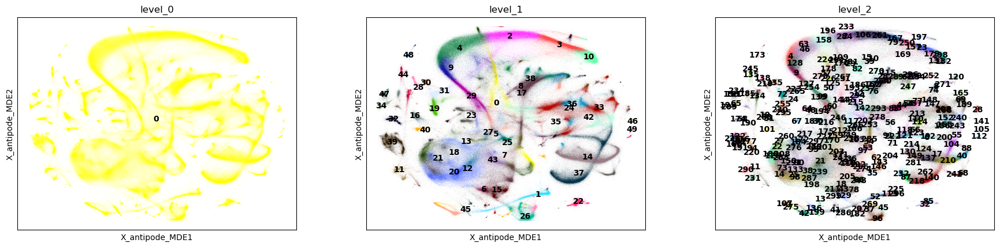

In [12]:
sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=[x for x in adata.obs.columns if 'level' in x],
    palette=sc.pl.palettes.godsnot_102,
    legend_loc='on data'
)

/scratch/fast/16801818/ipykernel_21975/1635427817.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  seaborn.clustermap(np.log(adata.obs.groupby('level_2')['supertype_label'].value_counts().unstack()+1),cmap='Purples')
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/antipode/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/antipode/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


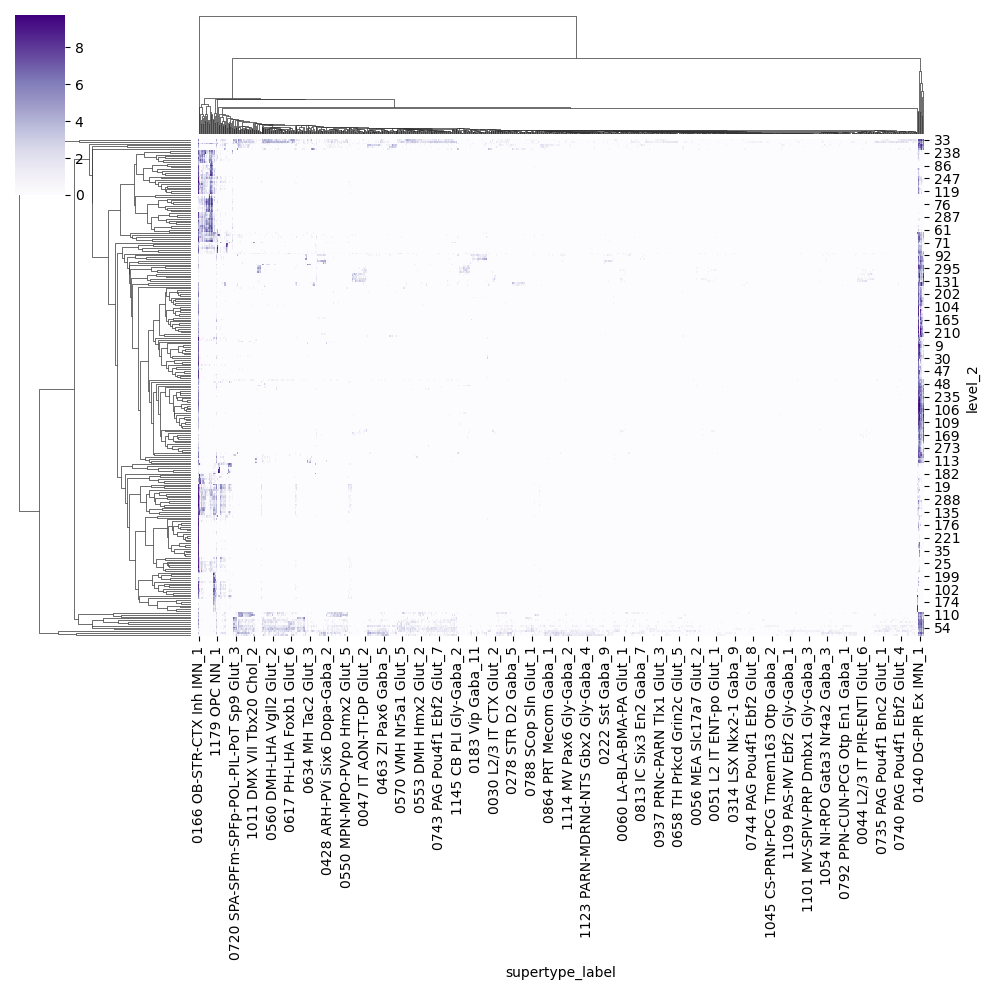

In [41]:
seaborn.clustermap(np.log(adata.obs.groupby('level_2')['supertype_label'].value_counts().unstack()+1),cmap='Purples')

/scratch/fast/16801818/ipykernel_21975/3918712556.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  seaborn.clustermap(np.log(adata.obs.groupby('level_2')['subclass_label'].value_counts().unstack()+1)[vcs.index],cmap='Purples')


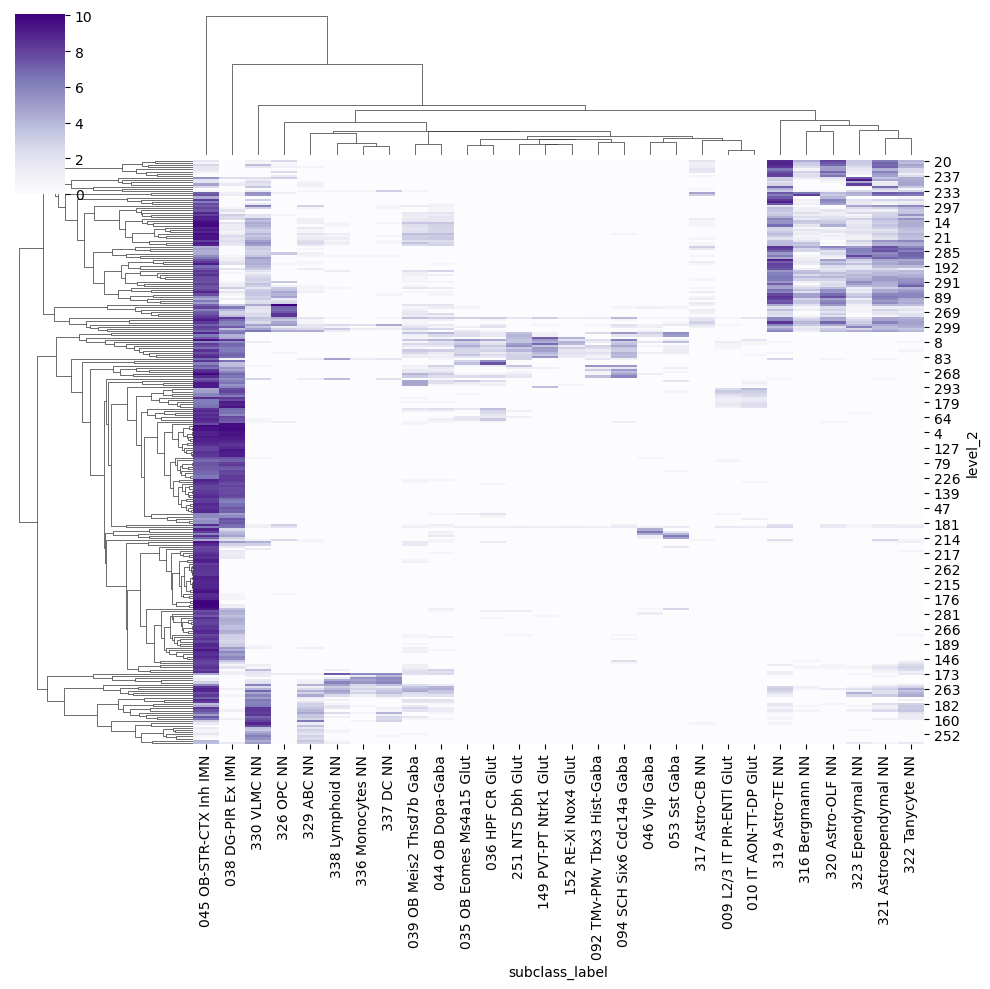

In [108]:
seaborn.clustermap(np.log(adata.obs.groupby('level_2')['subclass_label'].value_counts().unstack()+1)[vcs.index],cmap='Purples')

In [107]:
adata.obs.groupby('level_2')['subclass_label'].value_counts().unstack().idxmax(1)[209]

/scratch/fast/16801818/ipykernel_21975/1189061988.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  adata.obs.groupby('level_2')['subclass_label'].value_counts().unstack().idxmax(1)[209]
/scratch/fast/16801818/ipykernel_21975/1189061988.py:1: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  adata.obs.groupby('level_2')['subclass_label'].value_counts().unstack().idxmax(1)[209]


'045 OB-STR-CTX Inh IMN'

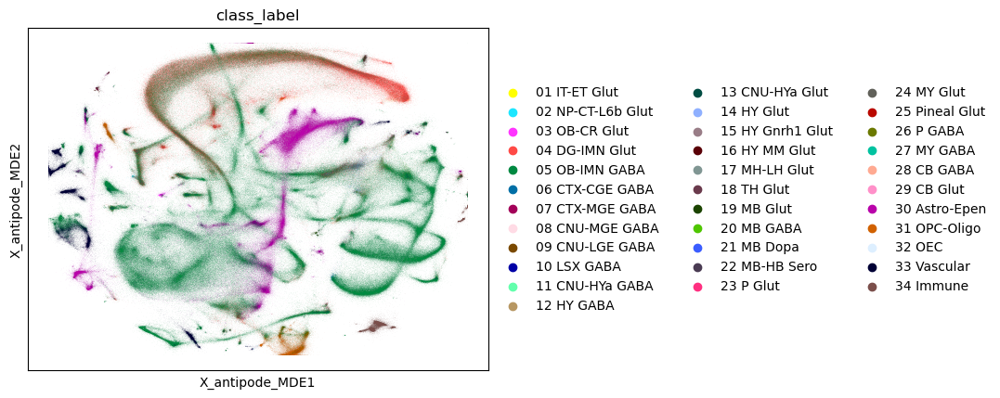

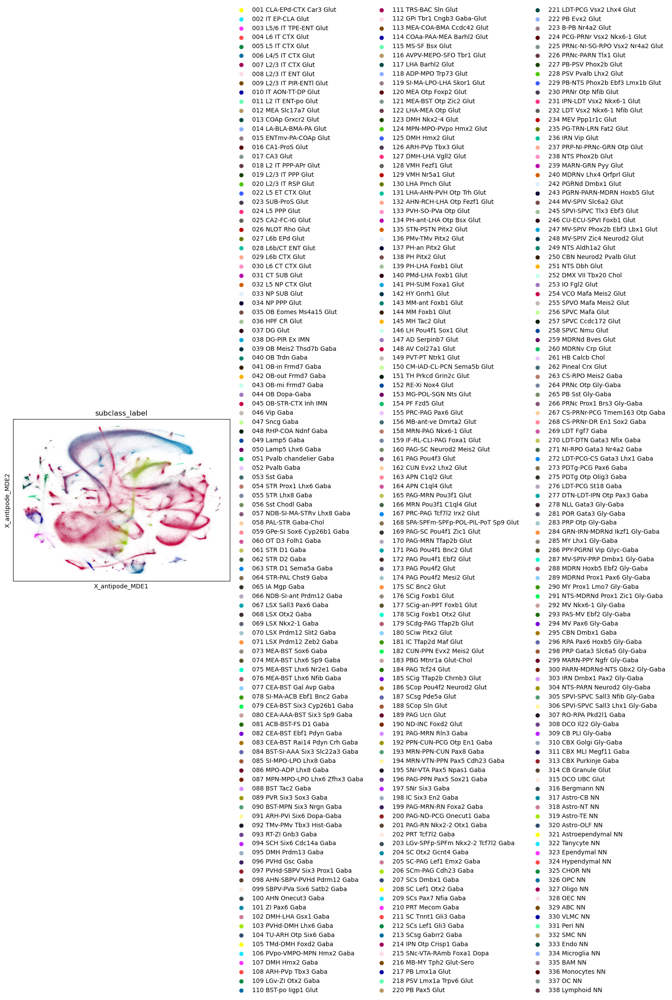

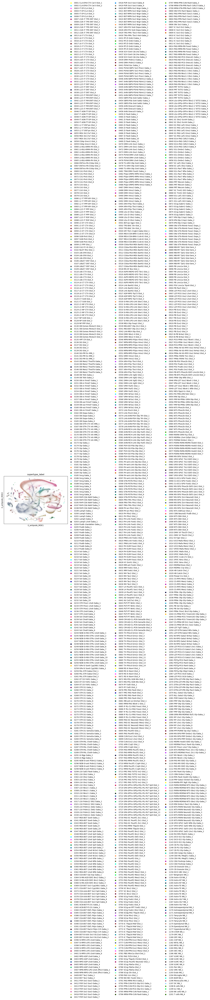

In [43]:
MDE_KEY='X_antipode_MDE'
sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=["class_label"],
    palette=sc.pl.palettes.godsnot_102
)
sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=["subclass_label"],
    palette=sc.pl.palettes.godsnot_102
)
sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=["supertype_label"],
    palette=sc.pl.palettes.godsnot_102
)

In [71]:
vcs=(adata.obs.groupby('level_2')['juvenile_subclass_label'].value_counts().unstack()>10).sum(0)
vcs=vcs[vcs>10]

/scratch/fast/16801818/ipykernel_21975/2147402715.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  vcs=(adata.obs.groupby('level_2')['juvenile_subclass_label'].value_counts().unstack()>10).sum(0)


In [72]:
vcs

juvenile_subclass_label
009 L2/3 IT PIR-ENTl Glut      18
010 IT AON-TT-DP Glut          11
035 OB Eomes Ms4a15 Glut       28
036 HPF CR Glut                24
038 DG-PIR Ex IMN              83
039 OB Meis2 Thsd7b Gaba       13
044 OB Dopa-Gaba               12
045 OB-STR-CTX Inh IMN        261
046 Vip Gaba                   13
053 Sst Gaba                   13
092 TMv-PMv Tbx3 Hist-Gaba     11
094 SCH Six6 Cdc14a Gaba       17
149 PVT-PT Ntrk1 Glut          11
152 RE-Xi Nox4 Glut            12
251 NTS Dbh Glut               16
316 Bergmann NN                15
317 Astro-CB NN                30
319 Astro-TE NN                59
320 Astro-OLF NN               51
321 Astroependymal NN          58
322 Tanycyte NN                57
323 Ependymal NN               11
326 OPC NN                     43
329 ABC NN                     15
330 VLMC NN                    43
336 Monocytes NN              103
337 DC NN                      21
338 Lymphoid NN               184
dtype: int64

In [73]:
sc_dict=adata.obs.groupby('level_2')['juvenile_subclass_label'].value_counts().unstack().drop(vcs.index,axis=1).idxmax(1).to_dict()

/scratch/fast/16801818/ipykernel_21975/2199464136.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  sc_dict=adata.obs.groupby('level_2')['juvenile_subclass_label'].value_counts().unstack().drop(vcs.index,axis=1).idxmax(1).to_dict()


In [74]:
adata.obs['juvenile_subclass_label_extended']=adata.obs['level_2'].replace(sc_dict)

/scratch/fast/16801818/ipykernel_21975/883740503.py:1: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  adata.obs['juvenile_subclass_label_extended']=adata.obs['level_2'].replace(sc_dict)


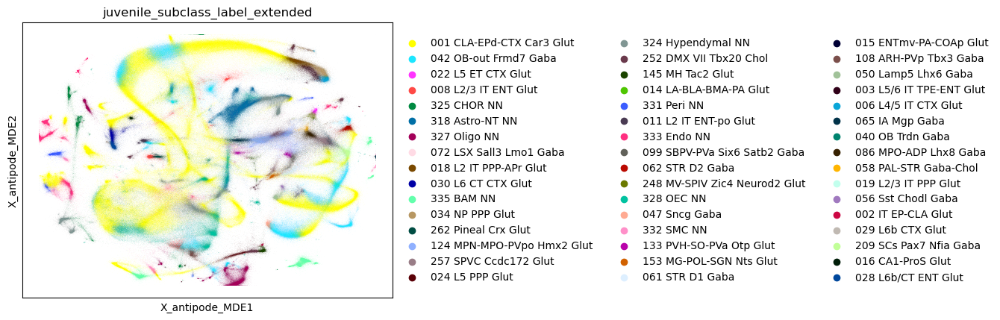

In [75]:
sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=["juvenile_subclass_label_extended"],
    palette=sc.pl.palettes.godsnot_102
)


/scratch/fast/16801818/ipykernel_21975/1772853189.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  seaborn.clustermap(np.log(adata.obs.groupby('juvenile_subclass_label_extended')['level_2'].value_counts().unstack()+1),cmap='Purples')
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/antipode/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/antipode/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


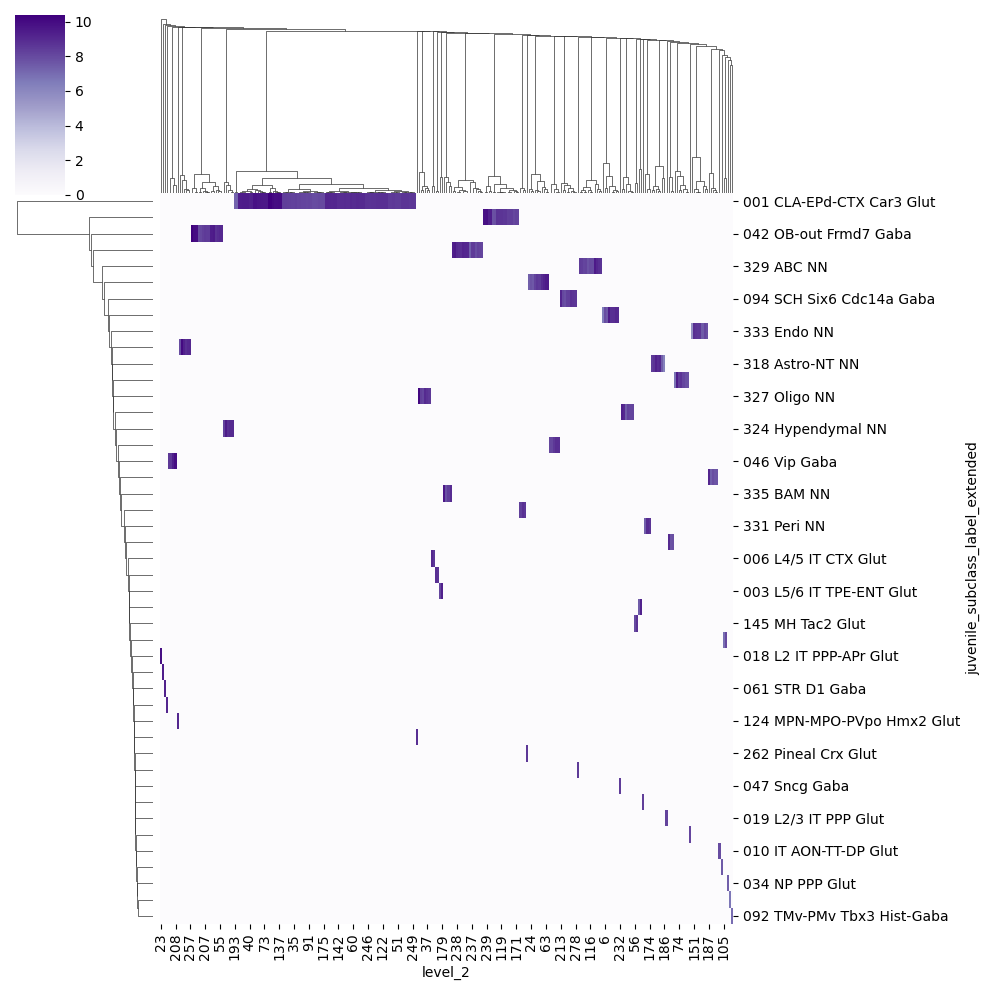

In [69]:
seaborn.clustermap(np.log(adata.obs.groupby('juvenile_subclass_label_extended')['level_2'].value_counts().unstack()+1),cmap='Purples')

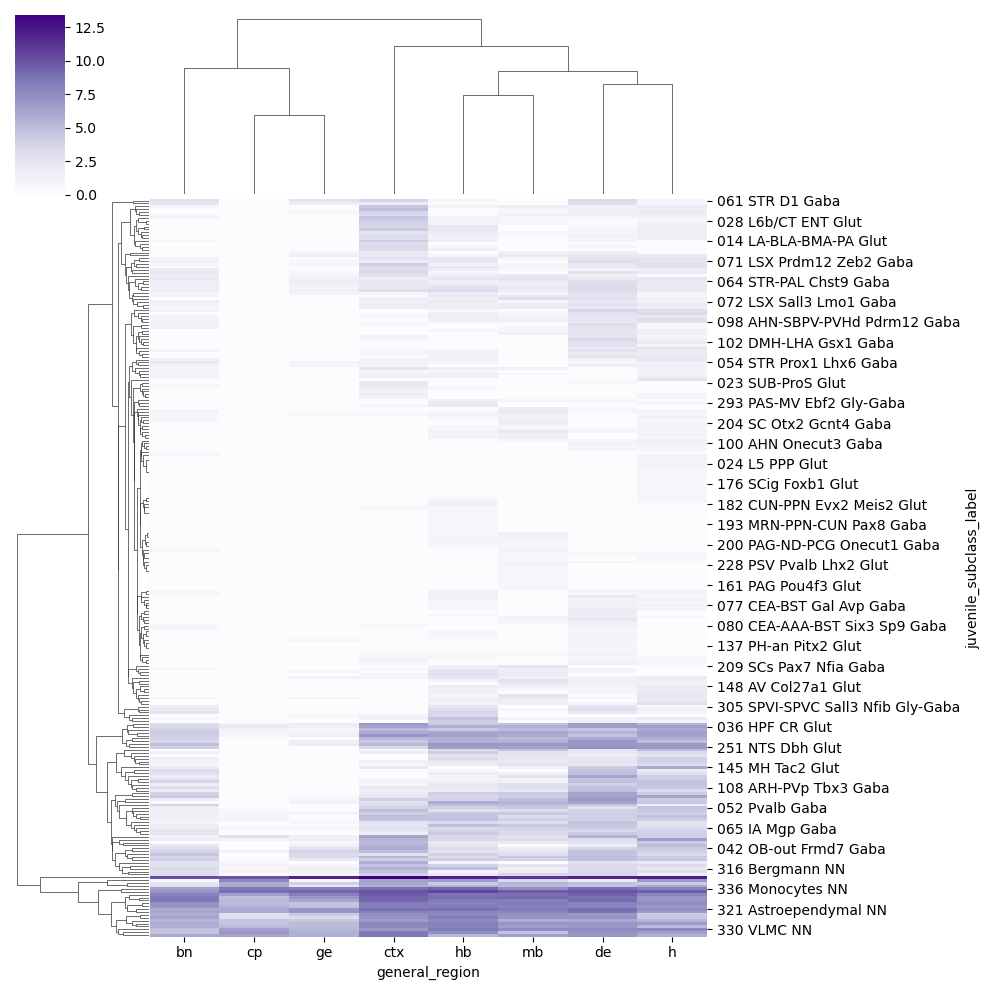

In [57]:
seaborn.clustermap(np.log(adata.obs.groupby('juvenile_subclass_label')['general_region'].value_counts().unstack()+1),cmap='Purples')

In [90]:
revdict=adata.obs.groupby('juvenile_subclass_label')['level_2'].value_counts().unstack().idxmax(1).to_dict()

/scratch/fast/16801818/ipykernel_21975/1941513733.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  revdict=adata.obs.groupby('juvenile_subclass_label')['level_2'].value_counts().unstack().idxmax(1).to_dict()


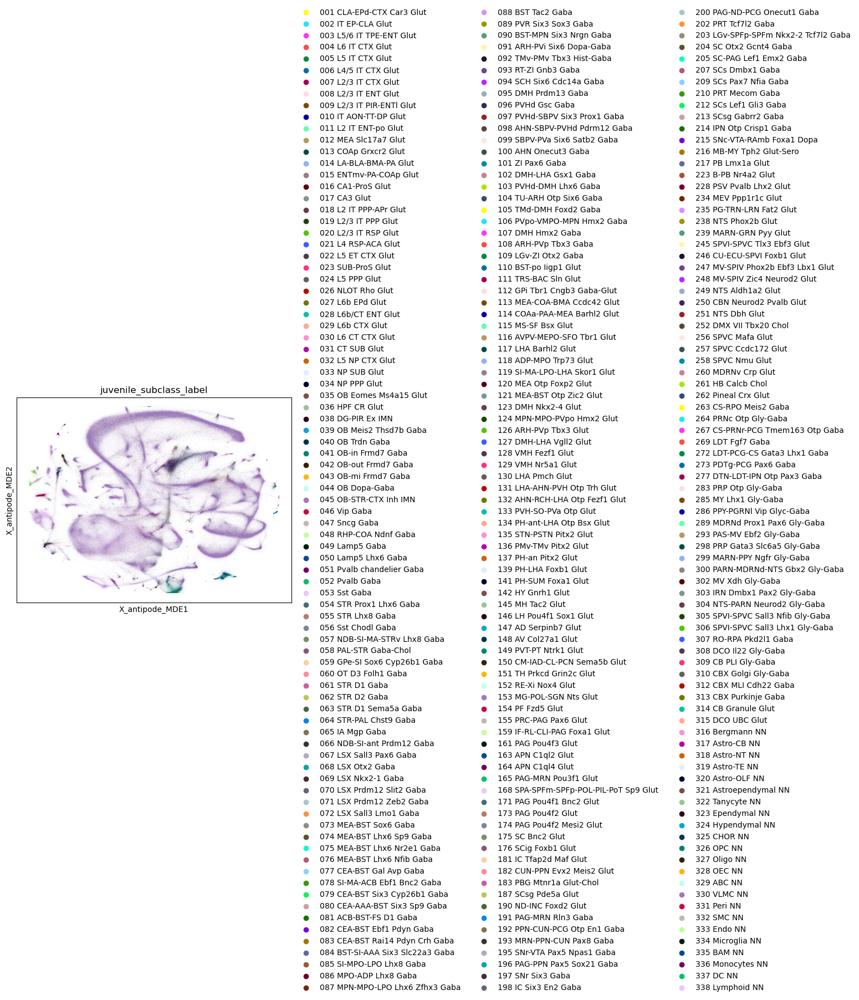

In [95]:
sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=["juvenile_subclass_label"],
    palette=sc.pl.palettes.godsnot_102
)


In [20]:
adata=adata.to_memory()
adata.layers['norm_spliced']=adata.layers['spliced'].copy()
adata.layers['norm_spliced']=scipy.sparse.csr_matrix(1e4*(adata.layers['norm_spliced']/adata.layers['norm_spliced'].sum(1)))

In [21]:
aggr_means=antipode.model_functions.group_aggr_anndata(adata,['species','level_2'],layer='norm_spliced')
log_real_means=np.log(aggr_means[0]+1e-3)

100%|██████████| 813/813 [03:04<00:00,  4.40it/s]


In [22]:
dev_mouse_means=pd.DataFrame(log_real_means[2],columns=adata.var.index,index=aggr_means[1]['level_2'])

In [23]:
subclass_meangenes

NameError: name 'subclass_meangenes' is not defined

In [ ]:
dev_mouse_means

In [ ]:
subclass_meangenes=subclass_meangenes.loc[:,subclass_meangenes.columns.isin(dev_mouse_means.columns)]

In [ ]:
dev_mouse_means=dev_mouse_means.loc[:,dev_mouse_means.columns.isin(subclass_meangenes.columns)]

In [ ]:
subclass_meangenes_array=subclass_meangenes.to_numpy()
dev_mouse_means_array=dev_mouse_means.to_numpy()

In [ ]:
coefs=[]
for i in tqdm.tqdm(range(dev_mouse_means_array.shape[0])):
    others=list(set(list(range(dev_mouse_means_array.shape[0])))-set([i]))
    coefs.append((dev_mouse_means_array[i:(i+1),:]-np.quantile(dev_mouse_means_array[others,:],0.8,axis=0)))#/(cluster_params.std(0)+cluster_params.std(0).mean()))
coefs=np.concatenate(coefs,axis=0)
dev_marker_df=pd.DataFrame(coefs,index=dev_mouse_means.index,columns=dev_mouse_means.columns)


In [ ]:
coefs=[]
for i in tqdm.tqdm(range(subclass_meangenes_array.shape[0])):
    others=list(set(list(range(subclass_meangenes_array.shape[0])))-set([i]))
    coefs.append((subclass_meangenes_array[i:(i+1),:]-np.quantile(subclass_meangenes_array[others,:],0.8,axis=0)))#/(cluster_params.std(0)+cluster_params.std(0).mean()))
coefs=np.concatenate(coefs,axis=0)
subclass_marker_df=pd.DataFrame(coefs,index=subclass_meangenes.index,columns=subclass_meangenes.columns)


In [ ]:
dev_marker_df[dev_marker_df<0]=0
subclass_marker_df[subclass_marker_df<0]=0

In [ ]:
def weighted_corr2_coeff(A, B, weights):
    '''
    Calculate weighted Pearson correlation of row vectors of A vs row vectors of B
    Weights correspond to the columns of the matrices A and B
    '''
    # Ensure weights is a numpy array and reshape it to be used for broadcasting
    weights = np.array(weights)
    weights = weights / weights.sum()  # Normalize weights
    
    # Rowwise weighted mean of input arrays & subtract from input arrays themselves
    A_mA = A - np.average(A, axis=1, weights=weights)[:, None]
    B_mB = B - np.average(B, axis=1, weights=weights)[:, None]
    
    # Sum of weighted squares across rows
    ssA = np.sum(weights * A_mA**2, axis=1)
    ssB = np.sum(weights * B_mB**2, axis=1)
    
    # Weighted dot product
    weighted_dot_product = np.dot(A_mA * weights, B_mB.T)
    
    # Finally get weighted corr coeff
    return weighted_dot_product / np.sqrt(np.outer(ssA, ssB))


In [ ]:
gl_path='/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matthew/data/taxtest/gene_lists/'
tf_genes=pd.read_csv(os.path.join(gl_path,'TFs_lambert_pmid29425488_1.01.txt'),sep='\t')
include_genes=tf_genes['hgnc_symbol']

In [ ]:
corrs=corr2_coeff(dev_mouse_means.loc[:,dev_mouse_means.columns.isin(include_genes)],subclass_meangenes.loc[:,subclass_meangenes.columns.isin(include_genes)])
corrs=corr2_coeff(dev_marker_dfs.loc[:,dev_mouse_means.columns.isin(include_genes)],subclass_marker_df.loc[:,subclass_meangenes.columns.isin(include_genes)])

subclass_marker_df
corrs=np.nan_to_num(corrs,0.)
corrs=pd.DataFrame(corrs,index=dev_mouse_means.index,columns=subclass_meangenes.index)

In [ ]:
seaborn.clustermap(corrs,cmap='coolwarm')

In [ ]:
marker_corr_dict=corrs.idxmax(1).to_dict()

In [ ]:
adata.obs['abc_subclass_markercor']=adata.obs['level_2'].replace(marker_corr_dict)

In [ ]:
seaborn.clustermap(np.log(adata.obs.groupby('level_2')['abc_subclass_markercor'].value_counts().unstack()+1),cmap='Purples')

In [ ]:
seaborn.clustermap(np.log(adata.obs.groupby('level_2')['abc_subclass_markercor'].value_counts().unstack()+1),cmap='Purples')

In [ ]:
sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=["abc_subclass_markercor"],
    palette=sc.pl.palettes.godsnot_102,
    legend_loc='on data',legend_fontsize=5
    
)
sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=["abc_subclass_markercor"],
    palette=sc.pl.palettes.godsnot_102
)

In [ ]:
corrs.idxmax(1).to_csv('/home/matthew.schmitz/corr_mapped.csv')

In [ ]:
corrs.idxmax(1)

In [115]:

# sc.pp.neighbors(adata, n_neighbors=30, use_rep='X_antipode')
# sc.tl.paga(adata, groups='level_2')
# sc.pl.paga(adata,node_size_power =5,node_size_scale=0.1,edge_width_scale = 0.02,fontsize=5,fontweight='light',)
# sc.pl.paga_compare(
#     adata,basis='X_antipode_MDE',
# )



KeyboardInterrupt



In [10]:
adata=sc.read_h5ad('/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matthew/1.9.1.6_DevAdult.h5ad')
MDE_KEY='X_antipode_MDE'

In [ ]:
/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matthew/data/mouse_wb/AIT21.all.freeze.230815_humanorthos_ABC_MAPPING

In [11]:
adata.X=adata.layers['spliced']

In [12]:
adata

AnnData object with n_obs × n_vars = 992888 × 15238
    obs: 'batch_name', 'stage', 'cl', 'cluster_id', 'cluster_label', 'subclass_id', 'subclass_label', 'class_id', 'class_label', 'supertype_id', 'supertype_label', 'umi.counts', 'gene.counts.0', 'external_donor_name', 'age', 'sex', 'roi', 'method', 'library_prep', 'doublet_score', 'qc.score', 'region_label', 'platform', 'core', 'knn.z', '_scvi_discov_ind', '_scvi_batch_ind', 'psi', 'q_score', 'level_0', 'level_1', 'level_2', 'antipode_cluster', 'kmeans'
    var: 'n_cells', 'highly_variable', 'highly_variable_nbatches', 'highly_variable_intersection', 'mean', 'std', 'highly_variable_rank', 'variances', 'variances_norm', 'means', 'mgi_symbol'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'antipode_cluster_colors', 'batch_name_colors', 'kmeans_colors', 'level_0_colors', 'level_1_colors', 'level_2_colors', 'param_store', 'stage_colors'
    obsm: 'X_antipode', 'X_antipode_MDE', 'discov_onehot', 'kmeans_onehot', 'taxon_probs'
    layers: 'sp

In [13]:
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)

In [21]:
adata.obs['cluster']=adata.obs['cluster'].astype(str)
adata.obs.loc[adata.obs['stage']=='adult','cluster']=adata.obs.loc[adata.obs['stage']=='adult','subclass_label'].astype(str)
adata.obs.loc[adata.obs['stage']=='dev','cluster']='antipode_'+adata.obs.loc[adata.obs['stage']=='dev','level_2'].astype(str)

In [22]:
cmeans=antipode.plotting.group_aggr_anndata(adata,'cluster',obsm=False)

100%|██████████| 663/663 [03:26<00:00,  3.20it/s]


/home/matthew.schmitz/Matthew/utils/miniforge3/envs/pyro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


/home/matthew.schmitz/Matthew/utils/miniforge3/envs/pyro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/pyro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/pyro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/pyro/lib/python3.11/site-packages/scanpy/plotting/_

/home/matthew.schmitz/Matthew/utils/miniforge3/envs/pyro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/pyro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/pyro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


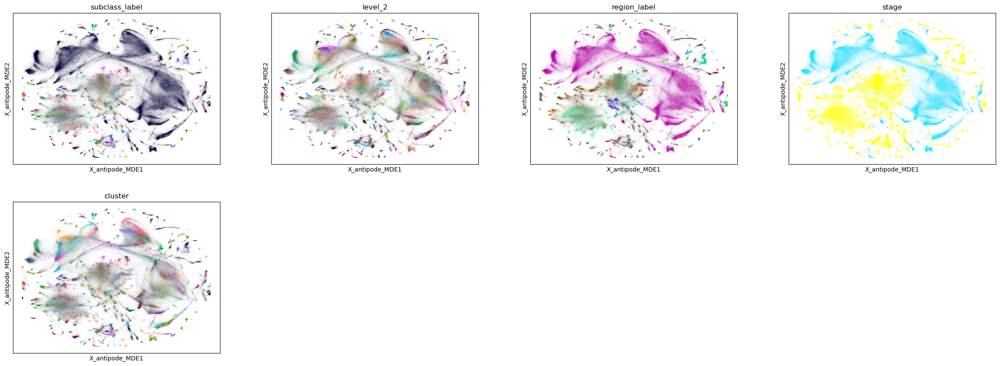

In [64]:
sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=["subclass_label",'level_2','region_label','stage','cluster'],
    legend_loc='none',
    palette=sc.pl.palettes.godsnot_102
)

In [28]:
acs=np.array(['antipode_' in x for x in cmeans[1]['cluster']])

In [37]:
adata.X.max()

8.651745838436138

In [59]:
scaled_cmeans=(cmeans[0]-cmeans[0].mean(-1)[:,np.newaxis])/cmeans[0].std(-1)[:,np.newaxis]

/home/matthew.schmitz/Matthew/utils/miniforge3/envs/pyro/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/pyro/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


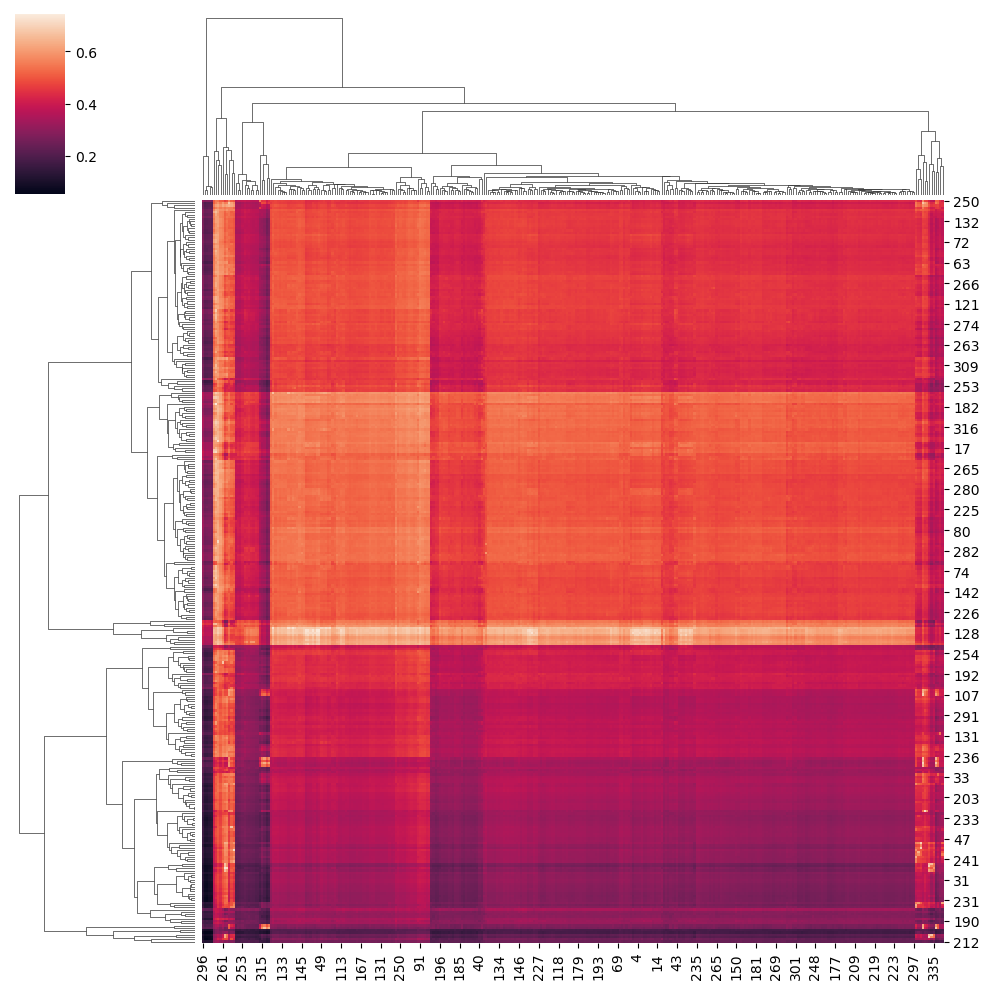

In [61]:
seaborn.clustermap(sc_analysis.corr2_coeff(scaled_cmeans[acs,:],scaled_cmeans[~acs,:]))

/home/matthew.schmitz/Matthew/utils/miniforge3/envs/pyro/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/pyro/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


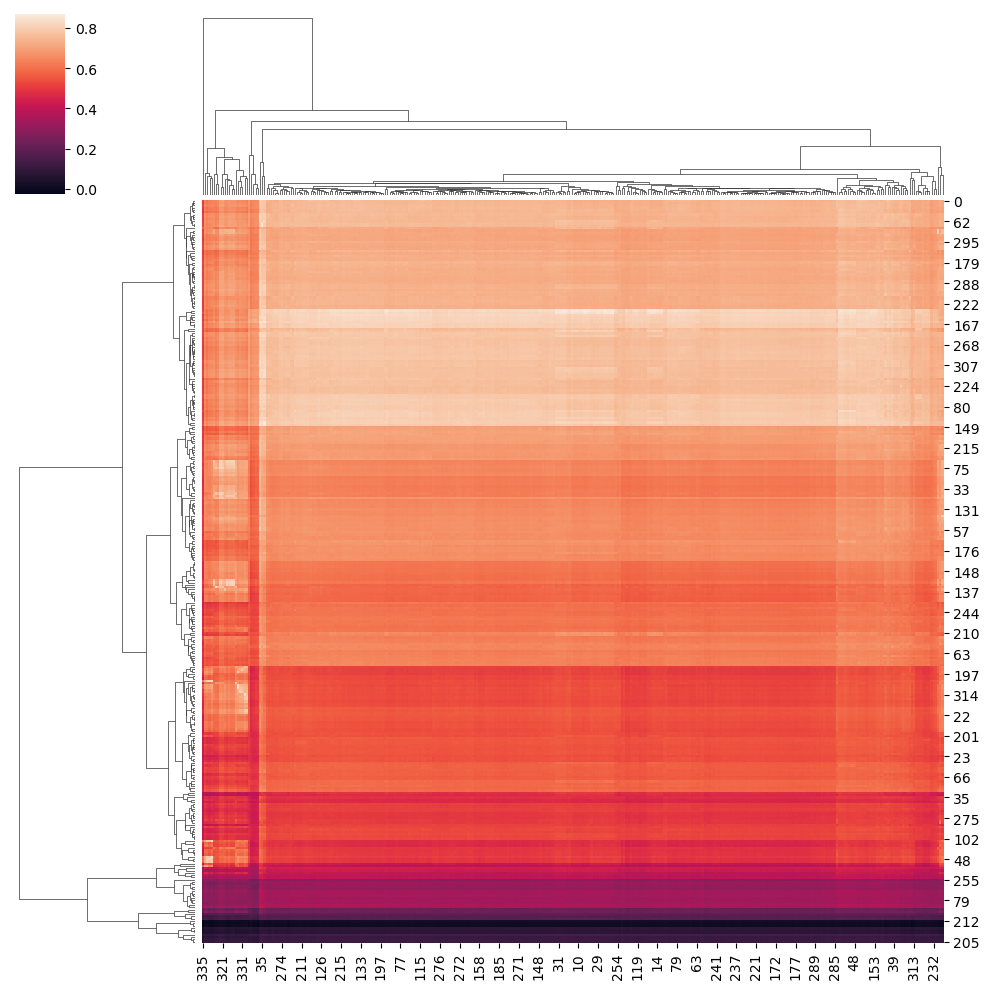

In [60]:
seaborn.clustermap(sc_analysis.corr2_coeff(scaled_cmeans.argsort(-1).argsort(-1)[acs,:],scaled_cmeans.argsort(-1).argsort(-1)[~acs,:]))

# LaManno Labels

In [3]:
adata=sc.read_h5ad('/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matthew/1.9.1.6_DevTighterNoPsi.h5ad',backed='r')

In [4]:
MDE_KEY='X_antipode_MDE'

In [170]:
linnarson_labels=pd.read_csv('/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matthew/data/taxtest/extra/mousefastqpool/SRP135960_linnarson_adultmouse/annotations/unambiguous_metadata_renamed.csv',index_col=0)

In [171]:
linnarson_labels.index

Index(['GCCTAGCTCGATAC_e10.0_Forebrain_SRR11947585-0',
       'GTGAACACGCGTTA_e10.0_Forebrain_SRR11947585-0',
       'GTTATGCTGAGGTG_e10.0_Forebrain_SRR11947585-0',
       'GATCCCTGTTGGTG_e10.0_Forebrain_SRR11947585-0',
       'AACTGTCTGGTAAA_e10.0_Forebrain_SRR11947585-0',
       'TGCAATCTTCCGAA_e10.0_Forebrain_SRR11947585-0',
       'GACGTAACGATAAG_e10.0_Forebrain_SRR11947585-0',
       'ACATCACTACGCAT_e10.0_Forebrain_SRR11947585-0',
       'ATAAGTTGAACGAA_e10.0_Forebrain_SRR11947585-0',
       'ACTTGTACCAACCA_e10.0_Forebrain_SRR11947585-0',
       ...
       'CTGAGCCTTAGAGA_e18.0_ForebrainVentroLateral_SRR11947657-0',
       'GATAGAGAATTCTC_e18.0_ForebrainVentroLateral_SRR11947657-0',
       'ATCACTTGTGGGAG_e18.0_ForebrainVentroLateral_SRR11947657-0',
       'ATTCGGGAACGGTT_e18.0_ForebrainVentroLateral_SRR11947657-0',
       'ATGCAGACGGATTC_e18.0_ForebrainVentroLateral_SRR11947657-0',
       'AATGAGGATGTCGA_e18.0_ForebrainVentroLateral_SRR11947657-0',
       'GAAATACTTGGTTG_e18.0_Fo

In [174]:
linnarson_labels=linnarson_labels.loc[linnarson_labels.index.isin(adata.obs.index),:]

In [176]:
cols=linnarson_labels.columns[~linnarson_labels.columns.isin(adata.obs.columns)]
adata.obs.loc[linnarson_labels.index,cols]=linnarson_labels.loc[:,cols]

In [ ]:
adata.obs

In [177]:
linnarson_labels['Class'].value_counts()

Class
Neuron                        99881
Neuroblast                    42571
Radial glia                   36772
Glioblast                     12206
Gastrulation                  11072
Bad cells                      8985
Mesenchyme                     7330
Fibroblast                     7183
Vascular                       6404
Ectoderm                       3494
Immune                         3369
Neural tube                    2888
Blood                          2449
Oligodendrocyte                2007
Neural crest                   1316
Mesoderm                       1287
Choroid plexus                  741
Schwann cell                    599
Endoderm                        370
Ependymal                       344
Olfactory ensheathing cell      270
Undefined                       144
Subcommissural organ            107
Pineal gland                    100
Name: count, dtype: int64

In [178]:
linnarson_labels['Subclass'].value_counts()

Subclass
Cortical or hippocampal glutamatergic    24410
Forebrain GABAergic                      20219
Midbrain glutamatergic                   14137
Undefined                                12837
Forebrain glutamatergic                  12391
                                         ...  
Arachnoid barrier cells                     15
Late isthmic organizer                      14
Pituitary neuroendocrine                    12
Parietal endoderm                           11
Olfactory epithelium                        10
Name: count, Length: 133, dtype: int64

In [179]:
MDE_KEY='X_antipode_MDE'
sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=["Class","Subclass","ClusterName"],
    palette=sc.pl.palettes.godsnot_102,
    legend_loc='on data'
)


UFuncTypeError: ufunc 'negative' did not contain a loop with signature matching types <class 'numpy.dtypes.VoidDType'> -> None

<Figure size 2183.4x480 with 0 Axes>

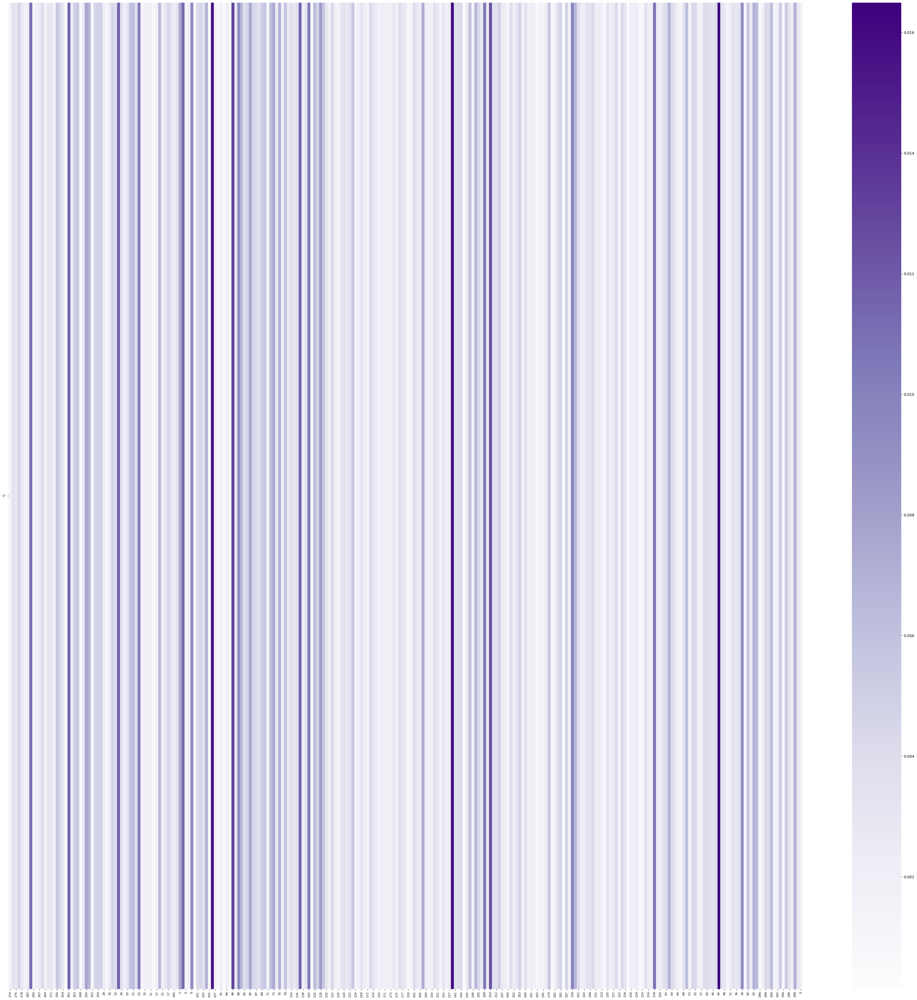

In [181]:
sc_analysis.create_heatmap(sc_analysis.get_cross_category_jaccard(adata.obs,'Class','level_2'),cmap='Purples')

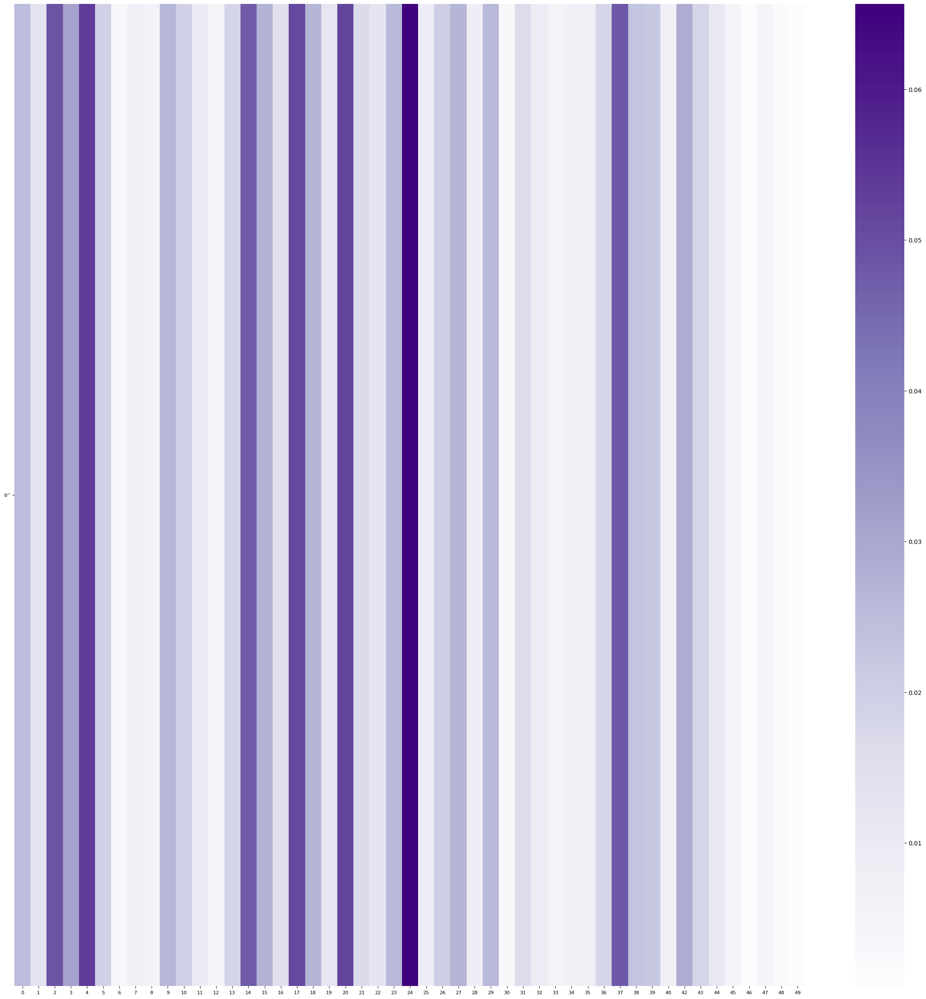

In [182]:
sc_analysis.create_heatmap(sc_analysis.get_cross_category_jaccard(adata.obs,'Subclass','level_1'),cmap='Purples')

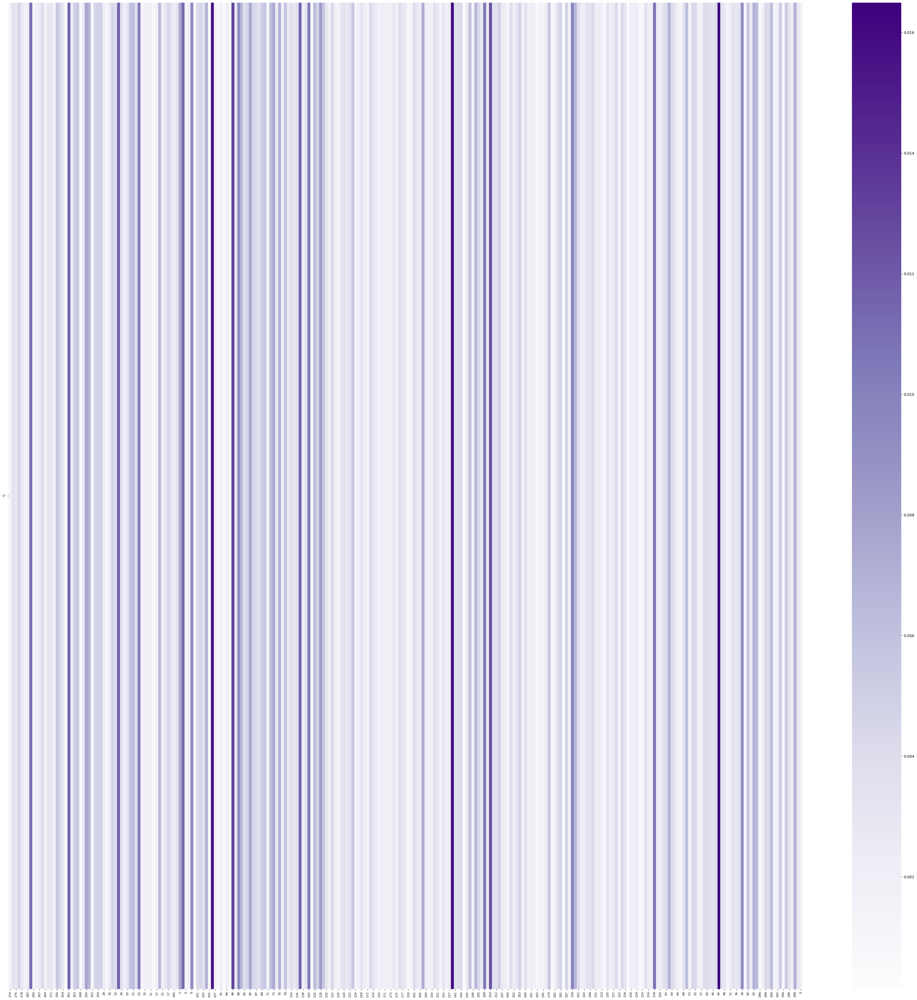

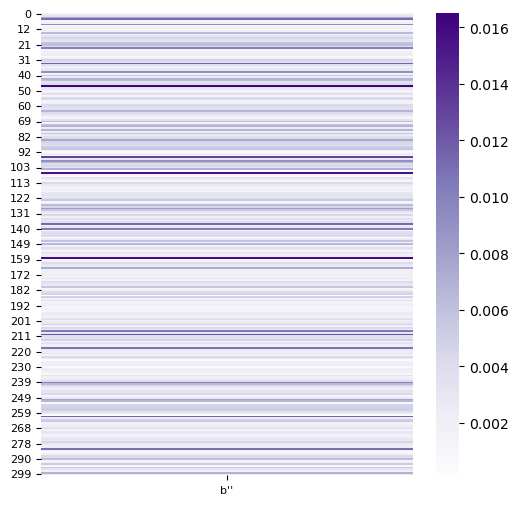

In [183]:
sc_analysis.create_heatmap(sc_analysis.get_cross_category_jaccard(adata.obs,'Subclass','level_2'),cmap='Purples')
sc_analysis.create_heatmap(sc_analysis.get_cross_category_jaccard(adata.obs,'level_2','Subclass'),cmap='Purples')

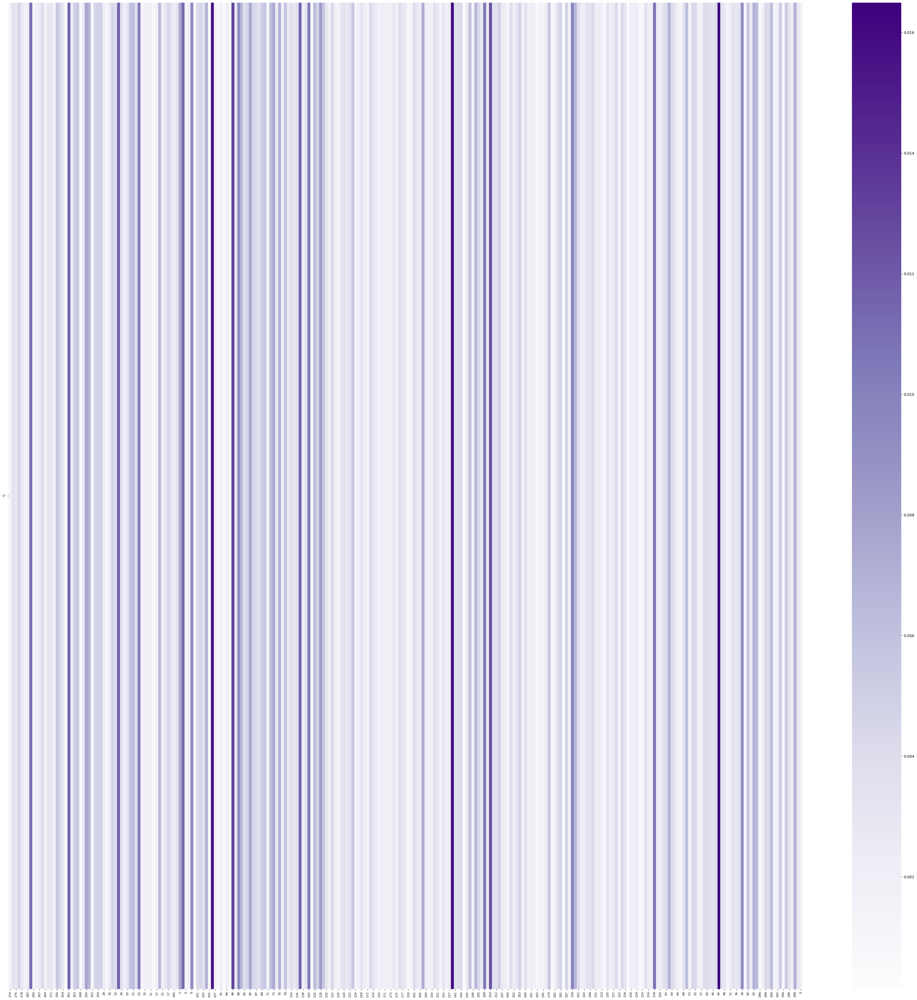

In [184]:
sc_analysis.create_heatmap(sc_analysis.get_cross_category_jaccard(adata.obs,'ClusterName','level_2'),cmap='Purples')

In [185]:
xcj=sc_analysis.get_cross_category_jaccard(adata.obs,'Subclass','level_2')

In [186]:
adata.obs['linnarson_extended']=adata.obs['level_2'].replace(xcj.idxmax(0).to_dict())

/scratch/fast/16723882/ipykernel_167192/2557748042.py:1: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  adata.obs['linnarson_extended']=adata.obs['level_2'].replace(xcj.idxmax(0).to_dict())


In [ ]:
MDE_KEY='X_antipode_MDE'
sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=["linnarson_extended",'level_2'],
    palette=sc.pl.palettes.godsnot_102,
    legend_loc='on data'
)

sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=["linnarson_extended"],
    palette=sc.pl.palettes.godsnot_102
)


In [18]:
adata.obs['linnarson_extended']=adata.obs['level_2'].replace(adata.obs.groupby('level_2')['Subclass'].value_counts().unstack().idxmax(1).to_dict())

/scratch/fast/15549867/ipykernel_75402/2375379283.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  adata.obs['linnarson_extended']=adata.obs['level_2'].replace(adata.obs.groupby('level_2')['Subclass'].value_counts().unstack().idxmax(1).to_dict())
/scratch/fast/15549867/ipykernel_75402/2375379283.py:1: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  adata.obs['linnarson_extended']=adata.obs['level_2'].replace(adata.obs.groupby('level_2')['Subclass'].value_counts().unstack().idxmax(1).to_dict())


/home/matthew.schmitz/Matthew/utils/miniforge3/envs/pyro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/pyro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


/home/matthew.schmitz/Matthew/utils/miniforge3/envs/pyro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/pyro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


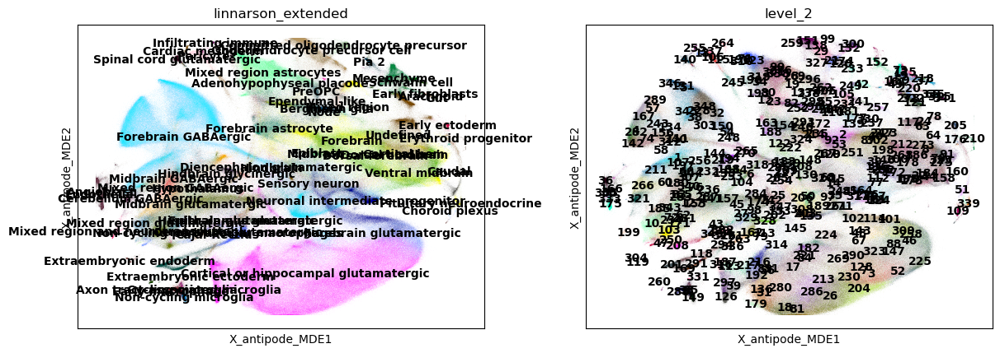

/home/matthew.schmitz/Matthew/utils/miniforge3/envs/pyro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/pyro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


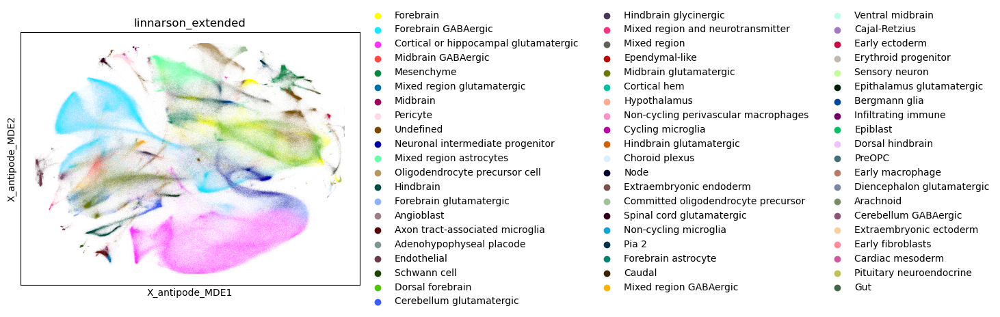

/home/matthew.schmitz/Matthew/utils/miniforge3/envs/pyro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/pyro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/pyro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value t

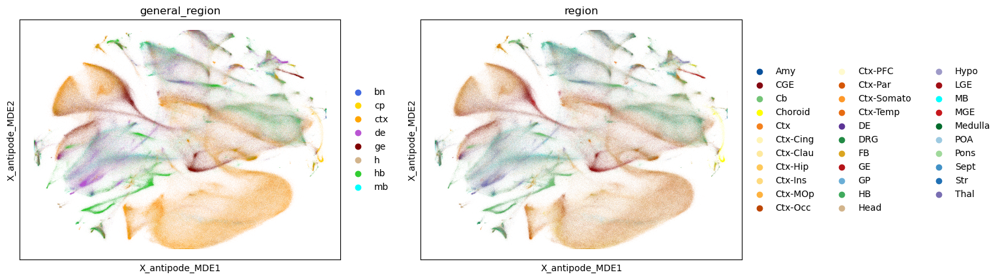

In [19]:
MDE_KEY='X_antipode_MDE'
sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=["linnarson_extended",'level_2'],
    palette=sc.pl.palettes.godsnot_102,
    legend_loc='on data'
)

sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=["linnarson_extended"],
    palette=sc.pl.palettes.godsnot_102
)

sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=["general_region",'region']
)


In [20]:
rpca_labels=pd.read_csv('/home/matthew.schmitz/Matthew/data/taxtest/HvQvM/other_integrations/rpca_cell_annotations.txt',index_col=0)

In [21]:
adata.obs.index=adata.obs.index.to_series().str.replace('-[0-9]+$','',regex=True).str.replace('-[0-9]+$','',regex=True)
adata.obs_names_make_unique()

In [22]:
rpca_labels.columns=['rpca_class','rpca_leiden']

In [23]:
rpca_labels.loc[rpca_labels.index[rpca_labels.index.isin(adata.obs.index)],:]

,rpca_class,rpca_leiden
TAGGGACTGGTACT_e18.0_ForebrainVentroLateral_SRR11947657,Neuron,3
TAGTGGTGATCGAC_e8.0_Head_SRR11947592,Fibroblast,19
CGTACCTGCAGATC_e15.0_Hindbrain_SRR11947621,Neuron,26
GTACTTTCATACGCCG_E18_hypothalamus_SAMN11975086,Neuron,26
CTTCTCTTCGTGGTCG_E13_hypothalamus_SAMN11975092,Neuron,9
...,...,...
GTGCAGCGTCACCTAA_GW10_hypothalamus_kOut,Neuron,22
CAACAACGTCAGGCAA_GW16_TemporalVZ_0_1_HNJJMDMXX_kOut,Neuron,25
TTCCCAGGTAGTGAAT_GW18_V1_kOut,Neuron,3
TGCGATATCCTTATCA_GW18_2_motorVZ_kOut,Neuron,6


In [24]:
adata.obs.loc[rpca_labels.index[rpca_labels.index.isin(adata.obs.index)],['rpca_class','rpca_leiden']]=rpca_labels.loc[rpca_labels.index[rpca_labels.index.isin(adata.obs.index)],:].astype(str)

In [25]:
adata.obs.loc[rpca_labels.index[rpca_labels.index.isin(adata.obs.index)],['rpca_class','rpca_leiden']]

,rpca_class,rpca_leiden
TAGGGACTGGTACT_e18.0_ForebrainVentroLateral_SRR11947657,Neuron,3
TAGTGGTGATCGAC_e8.0_Head_SRR11947592,Fibroblast,19
CGTACCTGCAGATC_e15.0_Hindbrain_SRR11947621,Neuron,26
GTACTTTCATACGCCG_E18_hypothalamus_SAMN11975086,Neuron,26
CTTCTCTTCGTGGTCG_E13_hypothalamus_SAMN11975092,Neuron,9
...,...,...
GTGCAGCGTCACCTAA_GW10_hypothalamus_kOut,Neuron,22
CAACAACGTCAGGCAA_GW16_TemporalVZ_0_1_HNJJMDMXX_kOut,Neuron,25
TTCCCAGGTAGTGAAT_GW18_V1_kOut,Neuron,3
TGCGATATCCTTATCA_GW18_2_motorVZ_kOut,Neuron,6


In [26]:
adata.obs['rpca_class_extended']=adata.obs['level_2'].replace(adata.obs.groupby('level_2')['rpca_class'].value_counts().unstack().idxmax(1).to_dict())

/scratch/fast/15549867/ipykernel_75402/843009307.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  adata.obs['rpca_class_extended']=adata.obs['level_2'].replace(adata.obs.groupby('level_2')['rpca_class'].value_counts().unstack().idxmax(1).to_dict())
/scratch/fast/15549867/ipykernel_75402/843009307.py:1: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  adata.obs['rpca_class_extended']=adata.obs['level_2'].replace(adata.obs.groupby('level_2')['rpca_class'].value_counts().unstack().idxmax(1).to_dict())


In [27]:
region_table=adata.obs.groupby('level_2')['general_region'].value_counts(normalize=True).unstack()

/scratch/fast/15549867/ipykernel_75402/353760866.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  region_table=adata.obs.groupby('level_2')['general_region'].value_counts(normalize=True).unstack()


In [28]:
tel_dict=(region_table['ctx']+region_table['ge']>0.5).to_dict()

In [29]:
adata.obs['telencephalon']=adata.obs['level_2'].replace(tel_dict)

/scratch/fast/15549867/ipykernel_75402/3253000605.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  adata.obs['telencephalon']=adata.obs['level_2'].replace(tel_dict)
/scratch/fast/15549867/ipykernel_75402/3253000605.py:1: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  adata.obs['telencephalon']=adata.obs['level_2'].replace(tel_dict)


/home/matthew.schmitz/Matthew/utils/miniforge3/envs/pyro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/pyro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


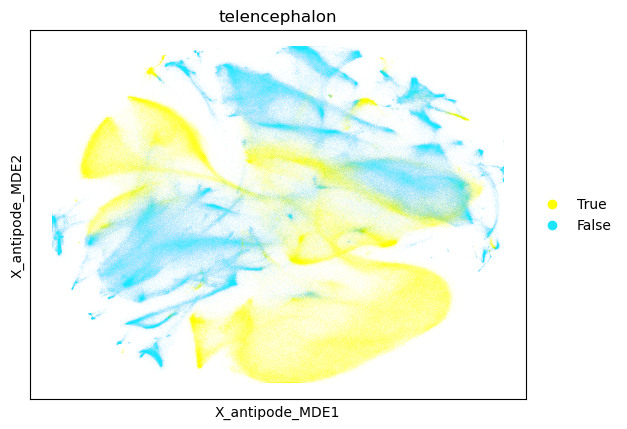

In [30]:
sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=['telencephalon'],
    palette=sc.pl.palettes.godsnot_102,
)

In [33]:
in_obs=pd.read_csv('/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matthew/data/taxtest/HvQvM/annotations/GSE169122_obs.csv.gz',index_col=0)

In [34]:
inds=adata.obs.index.str.replace(r'-\d+$', '', regex=True).str.replace(r'-\d+$', '', regex=True)
get_inds=inds[inds.isin(in_obs.index)]
adata.obs.loc[adata.obs.index[inds.isin(in_obs.index)],'initial_class']=list(in_obs.loc[adata.obs.index[inds.isin(in_obs.index)].str.replace(r'-\d+$', '', regex=True).str.replace(r'-\d+$', '', regex=True),'class'])

In [41]:
adata.obs.groupby('level_2')['initial_class'].value_counts().unstack()

/scratch/fast/15549867/ipykernel_75402/662381061.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  adata.obs.groupby('level_2')['initial_class'].value_counts().unstack()


initial_class,CGE_NR2F2/PROX1,G1-phase_SLC1A3/ATP1A1,G2-M_UBE2C/ASPM,LGE_FOXP1/ISL1,LGE_FOXP1/PENK,LGE_FOXP2/TSHZ1,LGE_MEIS2/PAX6,MGE_CRABP1/MAF,MGE_CRABP1/TAC3,MGE_LHX6/MAF,MGE_LHX6/NPY,RMTW_ZIC1/RELN,S-phase_MCM4/H43C,Transition,VMF_ZIC1/ZIC2,nan
level_2,,,,,,,,,,,,,,,,
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3558
1,60,0,2,1115,1888,445,98,2,0,167,3,1,1,19,97,13656
2,2,25,0,0,0,0,0,0,0,3,0,0,1,1,0,11332
3,7,0,0,0,0,0,0,1,0,12,8,1,0,0,0,25386
4,1638,0,0,1,1,29,46,9,15,63,36,0,1,8,6,5955
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
345,96,0,0,0,1,4,2,46,2,1343,1254,0,0,0,1,9640
346,2,0,0,0,0,0,0,7,0,298,17,0,0,0,0,1048
347,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,2008


In [88]:
counts=adata.obs.groupby('level_2')['initial_class'].value_counts().unstack().drop('nan',axis=1)
counts=((10+counts.T)/((10+counts).T.sum(0))).T
counts['nan']=0.3
adata.obs['ic_extended']=adata.obs['level_2'].replace(counts.idxmax(1).to_dict())

/scratch/fast/15549867/ipykernel_75402/1791168578.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  counts=adata.obs.groupby('level_2')['initial_class'].value_counts().unstack().drop('nan',axis=1)
/scratch/fast/15549867/ipykernel_75402/1791168578.py:4: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  adata.obs['ic_extended']=adata.obs['level_2'].replace(counts.idxmax(1).to_dict())


In [89]:
counts

initial_class,CGE_NR2F2/PROX1,G1-phase_SLC1A3/ATP1A1,G2-M_UBE2C/ASPM,LGE_FOXP1/ISL1,LGE_FOXP1/PENK,LGE_FOXP2/TSHZ1,LGE_MEIS2/PAX6,MGE_CRABP1/MAF,MGE_CRABP1/TAC3,MGE_LHX6/MAF,MGE_LHX6/NPY,RMTW_ZIC1/RELN,S-phase_MCM4/H43C,Transition,VMF_ZIC1/ZIC2,nan
level_2,,,,,,,,,,,,,,,,
0,0.066667,0.066667,0.066667,0.066667,0.066667,0.066667,0.066667,0.066667,0.066667,0.066667,0.066667,0.066667,0.066667,0.066667,0.066667,0.3
1,0.017292,0.002470,0.002964,0.277915,0.468874,0.112401,0.026680,0.002964,0.002470,0.043725,0.003211,0.002717,0.002717,0.007164,0.026433,0.3
2,0.065934,0.192308,0.054945,0.054945,0.054945,0.054945,0.054945,0.054945,0.054945,0.071429,0.054945,0.054945,0.060440,0.060440,0.054945,0.3
3,0.094972,0.055866,0.055866,0.055866,0.055866,0.055866,0.055866,0.061453,0.055866,0.122905,0.100559,0.061453,0.055866,0.055866,0.055866,0.3
4,0.822766,0.004993,0.004993,0.005492,0.005492,0.019471,0.027958,0.009486,0.012481,0.036445,0.022966,0.004993,0.005492,0.008987,0.007988,0.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
345,0.036564,0.003449,0.003449,0.003449,0.003794,0.004829,0.004139,0.019317,0.004139,0.466713,0.436012,0.003449,0.003449,0.003449,0.003794,0.3
346,0.025316,0.021097,0.021097,0.021097,0.021097,0.021097,0.021097,0.035865,0.021097,0.649789,0.056962,0.021097,0.021097,0.021097,0.021097,0.3
347,0.066225,0.072848,0.066225,0.066225,0.066225,0.066225,0.066225,0.066225,0.066225,0.066225,0.066225,0.066225,0.066225,0.066225,0.066225,0.3


/home/matthew.schmitz/Matthew/utils/miniforge3/envs/pyro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/pyro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


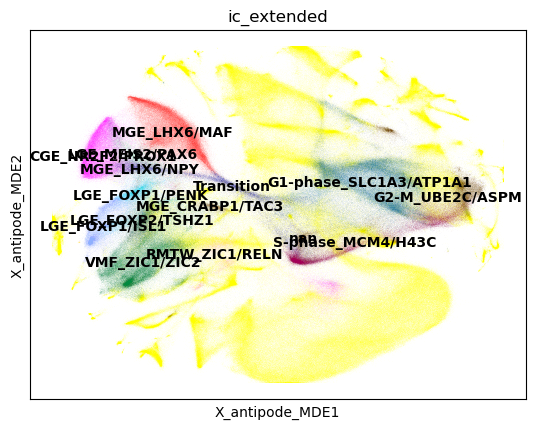

In [90]:
sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=['ic_extended'],
    palette=sc.pl.palettes.godsnot_102,
    legend_loc='on data'
)

/home/matthew.schmitz/Matthew/utils/miniforge3/envs/pyro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/pyro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


/home/matthew.schmitz/Matthew/utils/miniforge3/envs/pyro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/pyro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/pyro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value t

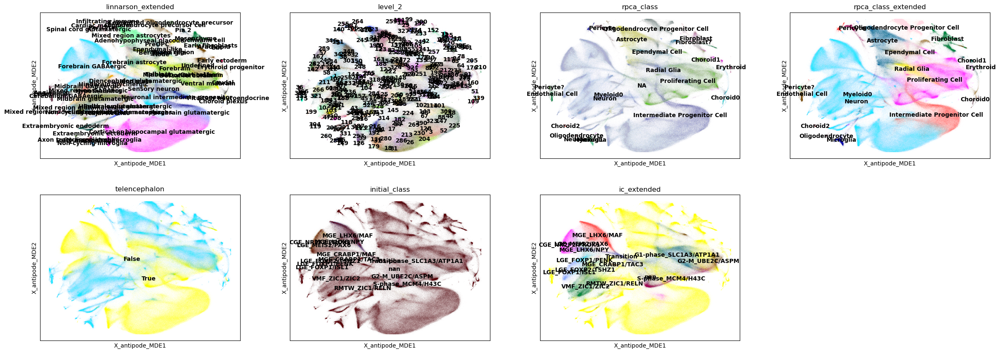

In [91]:
sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=["linnarson_extended",'level_2','rpca_class','rpca_class_extended','telencephalon','initial_class','ic_extended'],
    palette=sc.pl.palettes.godsnot_102,
    legend_loc='on data'
)

In [131]:
sc.pl.embedding(
    adata[adata.obs['level_2'].isin(['237','342']),:],
    basis=MDE_KEY,
    color=["linnarson_extended",'level_2','rpca_class','rpca_class_extended','telencephalon','initial_class','ic_extended'],
    palette=sc.pl.palettes.godsnot_102,
    legend_loc='on data'
)

/home/matthew.schmitz/Matthew/utils/miniforge3/envs/pyro/lib/python3.11/site-packages/scanpy/plotting/_utils.py:432: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


ValueError: To copy an AnnData object in backed mode, pass a filename: `.copy(filename='myfilename.h5ad')`. To load the object into memory, use `.to_memory()`.

<Figure size 2911.2x960 with 0 Axes>

In [121]:

def get_top_3_columns(row):
    return row.nlargest(3).index.tolist()

# Apply the function across the DataFrame rows
top_3_columns_per_row = adata.obs.groupby('level_2')['region'].value_counts().unstack().apply(get_top_3_columns, axis=1)
d=top_3_columns_per_row.to_dict()
d=dict(zip(d.keys(),[",".join(x) for x in d.values()]))

/scratch/fast/15549867/ipykernel_75402/1193383779.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  top_3_columns_per_row = adata.obs.groupby('level_2')['region'].value_counts().unstack().apply(get_top_3_columns, axis=1)


In [129]:
obs=adata.obs.loc[:,['level_2','ic_extended','rpca_class_extended','linnarson_extended']]
obs=obs.loc[~obs['level_2'].duplicated(),:]
obs['regions']=obs['level_2'].replace(d)
obs.to_csv('/home/matthew.schmitz/try_rectify_labels.csv')

/scratch/fast/15549867/ipykernel_75402/1564517868.py:3: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  obs['regions']=obs['level_2'].replace(d)


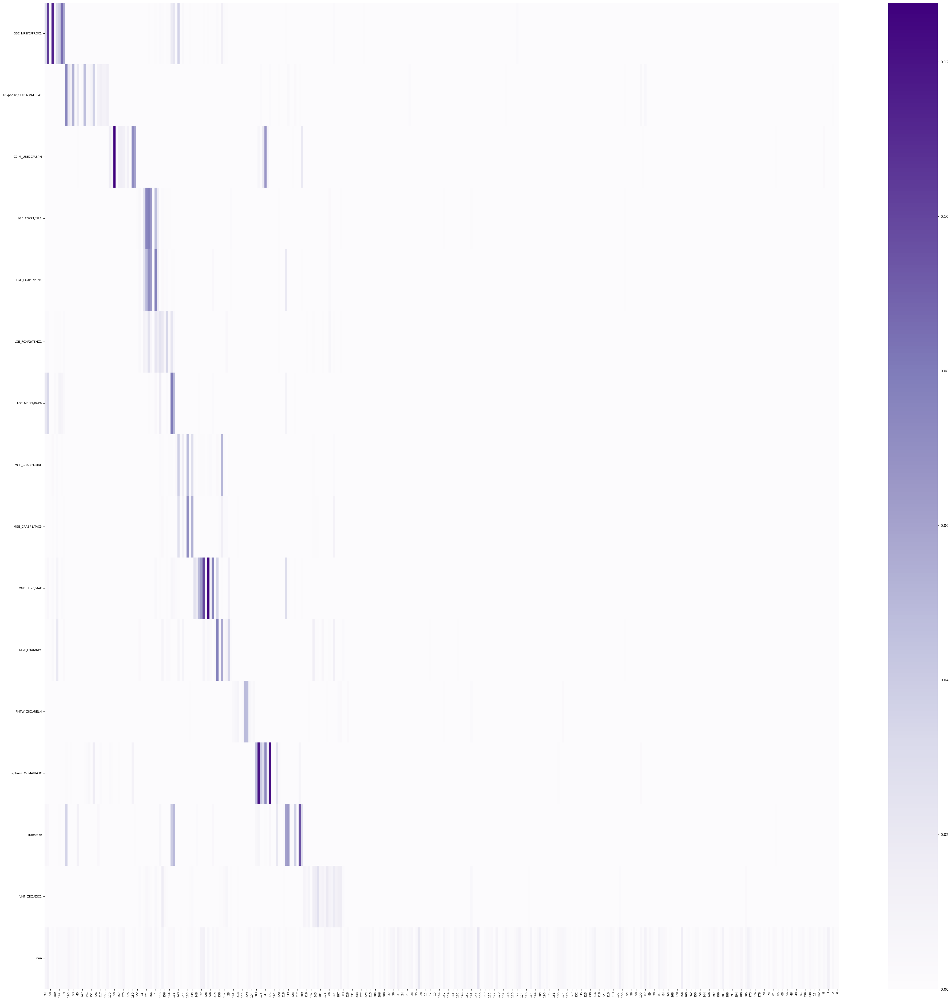

In [37]:
sc_analysis.create_heatmap(sc_analysis.get_cross_category_jaccard(adata.obs,'initial_class','level_2'),cmap='Purples')

In [38]:
adata[adata.obs['telencephalon'],:]

IndexError: Unknown indexer [True, True, True, True, True, ..., False, False, False, False, False]
Length: 2355534
Categories (2, bool): [True, False] of type <class 'pandas.core.arrays.categorical.Categorical'>